Name: Urwa Fatima


# Helper Functions

In [ ]:
# helper function for viewing single image
def plot_contour(single_img, seg_img, slice_index):
  #display segmentation contours
  binary_mask = (seg_img[:,:,slice_index] > 0).astype(np.uint8)
  # Find contours in the binary mask
  contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

  # Display the original image with the boundary
  plt.title('Mask Boundary Overlay')
  plt.imshow(single_img[:,:,slice_index], cmap='gray')
  plt.contour(binary_mask, colors='green', linewidths=1)
  plt.show()

def plot_single_img_mask_contour(img, mask, slice_index):
  plt.figure(figsize=(10,4))
  plt.subplot(131)
  plt.imshow(img[:,:,slice_index], cmap='gray')
  plt.title('Image')
  plt.subplot(132)
  plt.imshow(mask[:,:,slice_index])
  plt.title('Mask')
  plt.subplot(133)
  plot_contour(img, mask, slice_index )
  plt.show()


#helper function for viewing multiple images with its mask countors
def plot_img_contour(ax, single_img, seg_img, slice_index, i):
    # Display segmentation contours on the specified axes
    binary_mask = (seg_img[:, :, slice_index] > 0).astype(np.uint8)
    contours, _ = cv2.findContours(binary_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    ax[0].imshow(single_img[:, :, slice_index], cmap='gray')
    ax[0].set_title(f'Image {i + 1}')

    # Display the mask on the second column
    ax[1].imshow(seg_img[:, :, slice_index], cmap='gray')
    ax[1].set_title(f'Mask {i + 1}')

    # Display the image and mask with contours on the third column
    ax[2].imshow(single_img[:, :, slice_index], cmap='gray')
    ax[2].contour(binary_mask, colors='green', linewidths=1)
    ax[2].set_title(f'Mask Overlay {i + 1}')

def multi_image_view(image_list, mask_list, slice_indices):

    num_images = len(image_list)
    fig, axes = plt.subplots(nrows=num_images, ncols=3, figsize=(15, 5 * num_images))

    for i in range(num_images):
        plot_img_contour(axes[i], image_list[i], mask_list[i], slice_indices[i], i)

    plt.tight_layout()
    plt.show()


# Introduction

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Mon Feb 12 15:51:04 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla V100-SXM2-16GB           Off | 00000000:00:04.0 Off |                    0 |
| N/A   35C    P0              24W / 300W |      0MiB / 16384MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

### Libraries

In [ ]:
!pip install git+https://github.com/qubvel/segmentation_models

**Resolution of AttributeError in Google Colab**

Upon encountering an AttributeError when attempting to import the segmentation_models library in Google Colab, it is necessary to follow a corrective procedure. The AttributeError is as follows:

`AttributeError: module 'keras.utils' has no attribute 'generic_utils'`

To rectify this issue, the following steps are recommended:

**Locate the File**: click on the location of the the file specified in the error message. Typically, this file is found in the directory path
`"/usr/local/lib/python3.10/dist-packages/efficientnet/init.py".`

**Modify the Code**: Within the file, identify the line of code responsible for the AttributeError. Specifically, the line resembling the following structure:
`keras.utils.generic_utils.get_custom_objects().update(custom_objects)`

Here, the ".generic_utils" segment should be removed, resulting in the modified line:
`keras.utils.get_custom_objects().update(custom_objects)`

**Save Changes:** Once the code modification is performed, save the changes to the file.

**Restart Session:** To ensure the fix takes effect, restart the Colab session. This can be accomplished by navigating to the "Runtime" menu and selecting "Restart session".

**Verification:** After restarting the session,import the segmentation_models library once more. If the corrective actions were successful, the library should be imported without encountering the AttributeError.

In [1]:
import segmentation_models as sm

Segmentation Models: using `keras` framework.


In [2]:
import os
import numpy as np
import cv2
import nibabel as nib
import keras
import glob
import random
from matplotlib import pyplot as plt
from sklearn.preprocessing import MinMaxScaler

# Image and Mask Processing:

In [ ]:
# Load the MRI image
mri_img = nib.load('/content/drive/MyDrive/Prostate_Data/Site-A-RUNMC/Case26.nii.gz')

# Access the image data
data = mri_img.get_fdata()

# Access metadata
header = mri_img.header
affine = mri_img.affine

# Print metadata
print("Image shape:", data.shape)
print("Voxel size:", header.get_zooms())
print("Affine matrix:", affine)

Image shape: (384, 384, 20)
Voxel size: (0.5208333, 0.5208333, 3.5999985)
Affine matrix: [[ -0.52083331   0.           0.          90.21839905]
 [  0.          -0.52083331   0.          98.80965424]
 [  0.           0.           3.59999847 -57.61613464]
 [  0.           0.           0.           1.        ]]


# Mask Filtering

In [ ]:
# local_path ='/content/drive/MyDrive/Colab Notebooks/'
# Defining the threshold for low-information slices
threshold = 0.01

# Initializing dictionary to store low-info slice indices
low_info_slices_dict = {}
# image_shapes = []

# Defining the main folder path containing the data
main_folder_path = '/content/drive/MyDrive/Prostate_Data/'

# Iterate through each site folder
site_folders = [f.path for f in os.scandir(main_folder_path) if f.is_dir()]
scaler = MinMaxScaler()

for site_folder in site_folders:
    folder_name = site_folder.split('/')[-1]
    files = os.listdir(site_folder)
    mri_files = [f for f in files if f.endswith('.nii.gz') and ('segmentation' not in f.lower())]

    for mri_file in mri_files:
        mri_path = os.path.join(site_folder, mri_file)
        segmentation_path = os.path.join(site_folder, f"{mri_file.split('.')[0]}_segmentation.nii.gz")

        mri_img = nib.load(mri_path).get_fdata()
        seg_img = nib.load(segmentation_path).get_fdata().astype(np.uint8)

        # Normalize MRI image
        # mri_img = scaler.fit_transform(mri_img.reshape(-1, mri_img.shape[-1])).reshape(mri_img.shape)

        # Set segmentation mask to binary
        seg_img[seg_img > 0] = 1

        # Calculate slice information
        slice_information = np.sum(seg_img, axis=(0, 1)) / (seg_img.shape[0] * seg_img.shape[1])

        # Identify slices with less than the specified threshold
        low_info_slices = np.where(slice_information < threshold)[0]

        # Remove the identified low-info slices
        filtered_mri_img = np.delete(mri_img, low_info_slices, axis=2)
        filtered_seg_img = np.delete(seg_img, low_info_slices, axis=2)

        # Save low-info slice indices to dictionary
        low_info_slices_dict[os.path.join(folder_name, mri_file)] = [mri_img.shape, filtered_mri_img.shape, low_info_slices.tolist()]


        # # Save the modified 3D image
        np.save('/content/drive/MyDrive/Processed_Prostate_Data/Non_Normalized_Data/'+folder_name+'/mri_images/'+mri_file.split('.')[0]+'.npy', filtered_mri_img)
        np.save('/content/drive/MyDrive/Processed_Prostate_Data/Non_Normalized_Data/'+folder_name+'/mri_masks/'+mri_file.split('.')[0]+'-seg.npy', filtered_seg_img)


## Testing the filtered Masks

In [ ]:
img_list = list(low_info_slices_dict.keys())
print(img_list.index("Site-A-RUNMC/Case02.nii.gz"))
print(low_info_slices_dict[img_list[20]])
image_path = main_folder_path + '/'+img_list[20]
segmentation_path = main_folder_path + '/' + img_list[20].split('.')[0]+'_segmentation.nii.gz'
print(segmentation_path)

32
[(384, 384, 32), (384, 384, 13), [0, 1, 2, 3, 4, 5, 6, 7, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31]]
/content/drive/MyDrive/Prostate_Data//Site-B-BMC/Case22_segmentation.nii.gz


In [ ]:
temp_img = nib.load(image_path).get_fdata()
temp_seg = nib.load(segmentation_path).get_fdata().astype(np.uint8)

In [ ]:
temp_img.shape

(384, 384, 13)

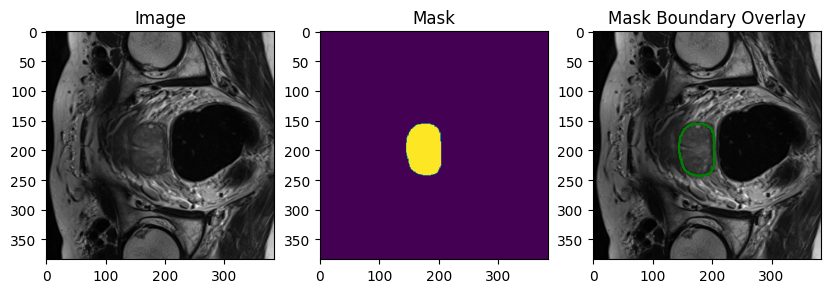

In [ ]:
slice_index = 8
plot_single_img_mask_contour(temp_img, temp_mask, slice_index)

# Splitting Data

In [ ]:
!pip install split-folders

In [ ]:
import splitfolders
input_folder = '/content/drive/MyDrive/Processed_Prostate_Data/Non_Normalized_Data/Site-A-RUNMC/'
output_folder = '/content/drive/MyDrive/Processed_Prostate_Data/Non_Normalized_Final_Data/Site-A-RUNMC-Splited/'

splitfolders.ratio(input_folder, output=output_folder, seed=42, ratio=(0.7, 0.2,0.1), group_prefix=None)

Copying files: 60 files [00:05, 10.75 files/s]


In [ ]:
input_folder = '/content/drive/MyDrive/Processed_Prostate_Data/Non_Normalized_Data/Site-B-BMC/'
output_folder = '/content/drive/MyDrive/Processed_Prostate_Data/Non_Normalized_Final_Data/Site-B-BMC-Splited/'

splitfolders.ratio(input_folder, output=output_folder, seed=42, ratio=(0.7, 0.2,0.1), group_prefix=None)

Copying files: 60 files [00:06,  9.36 files/s]


# Creating 3 Channel of 2D Slices of 3D MRI images

In [ ]:
def convert_to_rgb(image):
    """
    Convert a single-channel image to a pseudo RGB image.

    Args:
    - image: NumPy array representing a single-channel image (shape: (height, width)).

    Returns:
    - rgb_image: NumPy array representing a pseudo RGB image (shape: (height, width, 3)).
    """
    # Duplicate single-channel image to create a pseudo RGB image
    rgb_image = np.stack((image,) * 3, axis=-1)
    return rgb_image


In [ ]:
temp_img = np.load("/content/drive/MyDrive/Processed_Prostate_Data/Non_Normalized_Data/Site-A-RUNMC/mri_images/Case00.npy")
temp_mask = np.load("/content/drive/MyDrive/Processed_Prostate_Data/Non_Normalized_Data/Site-A-RUNMC/mri_masks/Case00-seg.npy")

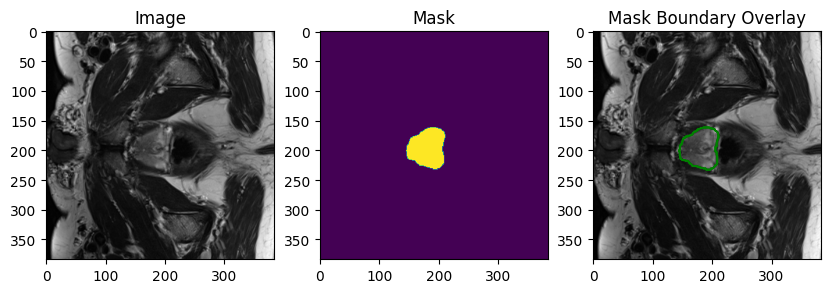

In [ ]:
rgb_image = convert_to_rgb(temp_img[:, :, 1])
rgb_mask = convert_to_rgb(temp_mask[:, :, 1])
plot_single_img_mask_contour(rgb_image, rgb_mask, 2)

In [ ]:
from skimage.transform import resize
# Define input and output directories
input_dir = '/content/drive/MyDrive/Processed_Prostate_Data/Non_Normalized_Final_Data/'
output_dir = '/content/drive/MyDrive/Training_Data/Non_Normalized_Resized224/'


In [ ]:
# Iterate through site folders
for site_folder in os.listdir(input_dir):
    site_path = os.path.join(input_dir, site_folder)

    # Check if the site folder contains the expected 'train', 'val', and 'test' directories
    if not all(folder_name in os.listdir(site_path) for folder_name in ['train', 'val', 'test']):
        continue  # Skip processing this site folder if it doesn't contain the expected subdirectories

    # Iterate through train, val, and test folders
    for split_folder in ['train', 'val', 'test']:
        split_path = os.path.join(site_path, split_folder)

        # Create output directories if they don't exist
        output_image_dir = os.path.join(output_dir, site_folder, split_folder, 'mri_images')
        output_mask_dir = os.path.join(output_dir, site_folder, split_folder, 'mri_masks')
        os.makedirs(output_image_dir, exist_ok=True)
        os.makedirs(output_mask_dir, exist_ok=True)

        # Iterate through MRI images
        for image_name in os.listdir(os.path.join(split_path, 'mri_images')):
            image_path = os.path.join(split_path, 'mri_images', image_name)
            mask_path = os.path.join(split_path, 'mri_masks', image_name.replace('.npy', '-seg.npy'))

            # Load 3D image and mask
            image = np.load(image_path)
            mask = np.load(mask_path)

            # Iterate through slices
            for i in range(image.shape[2]):
                # Convert single-channel image and mask slice to pseudo RGB images
                rgb_image = convert_to_rgb(image[:, :, i])
                rgb_mask = np.expand_dims(mask[:, :, i], axis=2)
                # rgb_mask = convert_to_rgb(mask[:, :, i])

                #resize images (384, 384) -> (224, 224)
                resized_img = resize(rgb_image, (224, 224, 3), anti_aliasing=True, preserve_range=True)
                resized_seg = resize(rgb_mask, (224, 224, 1), anti_aliasing=False, preserve_range=True)

                # Save pseudo RGB images as 2D slices
                slice_name = f"{site_folder.split('-')[1]}_{image_name.split('.')[0]}_slice_{i:02d}"
                image_slice_path = os.path.join(output_image_dir, slice_name)
                mask_slice_path = os.path.join(output_mask_dir, slice_name+"_seg")

                # print(rgb_image.shape, rgb_mask.shape)
                # print(resized_img.shape, resized_seg.shape)

                # # Save pseudo RGB images using NumPy's imsave
                np.save(image_slice_path, resized_img)
                np.save(mask_slice_path, resized_seg)


# Data Loader

In [3]:
class Dataset:
    """Custom dataset class for loading images and masks in .npy format."""

    def __init__(
            self,
            images_dir,
            masks_dir,
            preprocessing=None,
    ):
        self.images_fps = [os.path.join(images_dir, image_id) for image_id in sorted(os.listdir(images_dir))]
        self.masks_fps = [os.path.join(masks_dir, mask_id) for mask_id in sorted(os.listdir(masks_dir))]

        self.preprocessing = preprocessing

    def __getitem__(self, idx):
        # Read image and mask from .npy files
        image = np.load(self.images_fps[idx]).astype(np.float32)
        mask = np.load(self.masks_fps[idx]).astype(np.float32)

        # Apply preprocessing
        if self.preprocessing:
            # preprocessed = self.preprocessing(image=image, mask=mask)
            # image = preprocessed['image']
            # mask = preprocessed['mask']
            image = self.preprocessing(image)

        return image, mask

    def visualize_sample(self, idx):
        """Visualize the image and its corresponding mask."""
        image = np.load(self.images_fps[idx])
        mask = np.load(self.masks_fps[idx])

        plt.figure(figsize=(10, 5))

        # Plot image
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.title('Image')
        plt.axis('off')

        # Plot mask
        plt.subplot(1, 2, 2)
        plt.imshow(mask.squeeze(), cmap='gray')
        plt.title('Mask')
        plt.axis('off')

        plt.show()

    def __len__(self):
        return len(self.images_fps)


In [4]:
class Dataloader(keras.utils.Sequence):
    """Custom dataloader class for loading data from the dataset and forming batches."""

    def __init__(self, dataset, batch_size=1, shuffle=False):
        self.dataset = dataset
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.indexes = np.arange(len(dataset))

        self.on_epoch_end()

    def __getitem__(self, i):
        start = i * self.batch_size
        stop = (i + 1) * self.batch_size
        data = [self.dataset[j] for j in range(start, stop)]

        # Transpose list of lists
        batch = [np.stack(samples, axis=0) for samples in zip(*data)]

        return batch

    def __len__(self):
        return len(self.indexes) // self.batch_size

    def on_epoch_end(self):
        if self.shuffle:
            np.random.shuffle(self.indexes)

# Site A Dataset

In [5]:
local_path = '/content/drive/MyDrive/Non_Normalized_Resized224/'

In [6]:
# Site A
# Site A train set:  (250, 256, 256, 3) (250, 256, 256, 1)
# Site A val set:  (80, 256, 256, 3) (80, 256, 256, 1)
# Site A test set:  (39, 256, 256, 3) (39, 256, 256, 1)

#Training Images
A_train_img_dir = local_path +'Site-A-RUNMC-Splited/train/mri_images/'
A_train_mask_dir = local_path +'Site-A-RUNMC-Splited/train/mri_masks/'
# A_train_img_list = sorted(os.listdir(A_train_img_dir))
# A_train_mask_list = sorted(os.listdir(A_train_mask_dir))

# Validation Images
A_val_img_dir = local_path + 'Site-A-RUNMC-Splited/val/mri_images/'
A_val_mask_dir = local_path+'Site-A-RUNMC-Splited/val/mri_masks/'
# A_val_img_list = sorted(os.listdir(A_val_img_dir))
# A_val_mask_list = sorted(os.listdir(A_val_mask_dir))

#Test Images
A_test_img_dir = local_path+'Site-A-RUNMC-Splited/test/mri_images/'
A_test_mask_dir = local_path + 'Site-A-RUNMC-Splited/test/mri_masks/'
# A_test_img_list = sorted(os.listdir(A_test_img_dir))
# A_test_mask_list = sorted(os.listdir(A_test_mask_dir))

# Site B Dataset

In [7]:
# Site B

# Site B train set:  (267, 256, 256, 3) (267, 256, 256, 1)
# Site B val set:  (70, 256, 256, 3) (70, 256, 256, 1)
# Site B test set:  (37, 256, 256, 3) (37, 256, 256, 1)

#Training Images
B_train_img_dir = local_path + 'Site-B-BMC-Splited/train/mri_images/'
B_train_mask_dir = local_path +'Site-B-BMC-Splited/train/mri_masks/'

# B_train_img_list = sorted(os.listdir(B_train_img_dir))
# B_train_mask_list = sorted(os.listdir(B_train_mask_dir))

# Validation Images
B_val_img_dir = local_path + 'Site-B-BMC-Splited/val/mri_images/'
B_val_mask_dir = local_path + 'Site-B-BMC-Splited/val/mri_masks/'

# B_val_img_list = sorted(os.listdir(B_val_img_dir))
# B_val_mask_list = sorted(os.listdir(B_val_mask_dir))

#Test Images
B_test_img_dir = local_path + 'Site-B-BMC-Splited/test/mri_images/'
B_test_mask_dir = local_path + 'Site-B-BMC-Splited/test/mri_masks/'
# B_test_img_list = sorted(os.listdir(B_test_img_dir))
# B_test_mask_list = sorted(os.listdir(B_test_mask_dir))

# Model Training For UNET

## Helper Functions

In [163]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, CSVLogger

def create_callbacks(local_path, site, backbone, epoch, lr):
    # Define file paths for saving checkpoints and logs
    checkpoint_path = f'{local_path}Saved_Models/callbacks/Site_{site}/'
    log_path = f'{local_path}Saved_Models/logs/Site_{site}/'


    # Ensure directories exist
    os.makedirs(checkpoint_path, exist_ok=True)
    os.makedirs(log_path, exist_ok=True)


    # Define file names dynamically
    checkpoint_file = os.path.join(checkpoint_path, f'{backbone}_model_{site}_{epoch}epoch_LR{str(lr).replace(".","")}.h5')
    log_file = os.path.join(log_path, f'my_logs_{backbone}_{site}_{epoch}epoch_LR{str(lr).replace(".","")}.csv')

    # Create callbacks
    checkpoint = ModelCheckpoint(checkpoint_file, save_weights_only=True, save_best_only=True, mode='min')
    early_stop = EarlyStopping(monitor='val_loss', patience=3, verbose=1)
    log_csv = CSVLogger(log_file, separator=',', append=False)

    return [checkpoint, early_stop, log_csv]
    # return [checkpoint, log_csv]


In [40]:
def save_model(local_path, site, backbone, model, epoch, lr):
    # Define the model path based on site and backbone
    model_path = f'{local_path}Saved_Models/models/Site_{site}/'
    os.makedirs(model_path, exist_ok=True)

    # Construct the file name dynamically using the epoch number
    model_file = f'{backbone}_{site}_{epoch}epochs_LR{str(lr).replace(".","")}.hdf5'

    # Save the model to the specified path
    model.save(os.path.join(model_path, model_file))


In [41]:
def plot_history(history):
    # Plot training & validation iou_score values
    acc = history.history['iou_score']
    val_acc = history.history['val_iou_score']
    plt.figure(figsize=(30, 7))
    plt.subplot(121)
    plt.plot(acc)
    plt.plot(val_acc)
    plt.title('Model iou_score')
    plt.ylabel('iou_score')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')

    # Plot training & validation loss values
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    plt.subplot(122)
    plt.plot(loss)
    plt.plot(val_loss)
    plt.title('Model loss')
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['Train', 'Test'], loc='upper left')
    plt.show()


In [11]:
# helper function for data visualization
def visualize(**images):
    """PLot images in one row."""
    n = len(images)
    plt.figure(figsize=(16, 5))
    for i, (name, image) in enumerate(images.items()):
        plt.subplot(1, n, i + 1)
        plt.xticks([])
        plt.yticks([])
        plt.title(' '.join(name.split('_')).title())
        plt.imshow(image)
    plt.show()

# helper function for data visualization
def denormalize(x):
    """Scale image to range 0..1 for correct plot"""
    x_max = np.percentile(x, 98)
    x_min = np.percentile(x, 2)
    x = (x - x_min) / (x_max - x_min)
    x = x.clip(0, 1)
    return x

## Common Parameters

In [164]:
n_classes=1
activation='sigmoid'
epoch = 34
LR = 0.0001
optim = keras.optimizers.Adam(LR)
BATCH_SIZE = 10

# Segmentation models losses can be combined together by '+' and scaled by integer or float factor
# set class weights for dice_loss (car: 1.; pedestrian: 2.; background: 0.5;)
dice_loss = sm.losses.DiceLoss()
focal_loss = sm.losses.BinaryFocalLoss()
total_loss = dice_loss + (1 * focal_loss)

# actulally total_loss can be imported directly from library, above example just show you how to manipulate with losses
# total_loss = sm.losses.binary_focal_dice_loss # or sm.losses.categorical_focal_dice_loss

metrics = [sm.metrics.IOUScore(threshold=0.5), sm.metrics.FScore(threshold=0.5)]


## VVG19

In [ ]:
BACKBONE1 = 'vgg19'
preprocess_input1 = sm.get_preprocessing(BACKBONE1)

In [ ]:
# define model
model1 = sm.Unet(BACKBONE1, encoder_weights='imagenet', classes=n_classes, activation=activation)

# compile keras model with defined optimozer, loss and metrics
model1.compile(optim, total_loss, metrics=metrics)

# print(model1.summary())

80134624/80134624 [==============================] - 0s 0us/step


### VGG19 Training on Site A Dataset

In [ ]:
SITE = "A"
callbacks_site_A_vgg19 = create_callbacks(local_path = local_path, site= SITE, backbone= BACKBONE1, epoch=epoch, lr=LR)

In [ ]:
# Dataset for train images
train_dataset_A = Dataset(
    A_train_img_dir,
    A_train_mask_dir,
    # preprocessing=get_preprocessing(preprocess_input1),
    preprocessing= preprocess_input1,
)

# Dataset for validation images
valid_dataset_A = Dataset(
    A_val_img_dir,
    A_val_mask_dir,
    # preprocessing=get_preprocessing(preprocess_input1),
    preprocessing= preprocess_input1,
)

# Initialize dataloaders
train_dataloader_A = Dataloader(train_dataset_A, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader_A = Dataloader(valid_dataset_A, batch_size=1, shuffle=False)


In [ ]:
# train model
history1A = model1.fit_generator(
    train_dataloader_A,
    steps_per_epoch=len(train_dataloader_A),
    epochs=epoch,
    callbacks=callbacks_site_A_vgg19,
    validation_data=valid_dataloader_A,
    validation_steps=len(valid_dataloader_A),
)

<ipython-input-113-9ff6f2f08d81>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history1A = model1.fit_generator(


Epoch 1/50
25/25 [==============================] - 16s 196ms/step - loss: 0.9728 - iou_score: 0.0565 - f1-score: 0.1058 - val_loss: 0.9629 - val_iou_score: 0.0075 - val_f1-score: 0.0149
Epoch 2/50
25/25 [==============================] - 6s 243ms/step - loss: 0.9332 - iou_score: 0.1512 - f1-score: 0.2596 - val_loss: 0.9525 - val_iou_score: 0.0038 - val_f1-score: 0.0074
Epoch 3/50
25/25 [==============================] - 5s 187ms/step - loss: 0.8991 - iou_score: 0.2518 - f1-score: 0.3948 - val_loss: 0.9438 - val_iou_score: 0.0054 - val_f1-score: 0.0101
Epoch 4/50
25/25 [==============================] - 4s 158ms/step - loss: 0.8693 - iou_score: 0.2986 - f1-score: 0.4511 - val_loss: 0.9563 - val_iou_score: 0.0183 - val_f1-score: 0.0305
Epoch 5/50
25/25 [==============================] - 6s 243ms/step - loss: 0.8379 - iou_score: 0.3423 - f1-score: 0.5014 - val_loss: 0.9453 - val_iou_score: 0.0657 - val_f1-score: 0.1104
Epoch 6/50
25/25 [==============================] - 6s 219ms/step - l

In [ ]:
save_model(local_path = local_path, site = SITE, backbone = BACKBONE1 , model = model1, epoch = epoch, lr=LR )

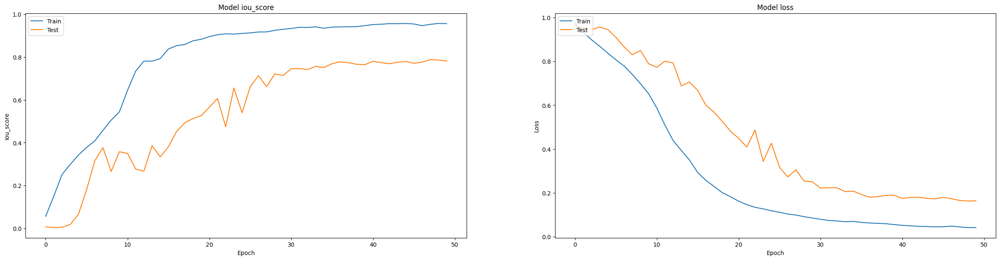

In [ ]:
plot_history(history= history1A)

In [ ]:
test_dataset = Dataset(
    A_test_img_dir,
    A_test_mask_dir,
    preprocessing=preprocess_input1,
)

test_dataloader = Dataloader(test_dataset, batch_size=1, shuffle=False)

In [ ]:
# load best weights
model1.load_weights(local_path+'Saved_Models/callbacks/Site_A/vgg19_model_without_EarlyStopping_LR00001.h5')

In [ ]:
scores = model1.evaluate_generator(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print("mean {}: {:.5}".format(metric.__name__, value))

<ipython-input-118-8856f6f7a017>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  scores = model1.evaluate_generator(test_dataloader)


Loss: 0.1323
mean iou_score: 0.8152
mean f1-score: 0.89302


1/1 [==============================] - 0s 353ms/step


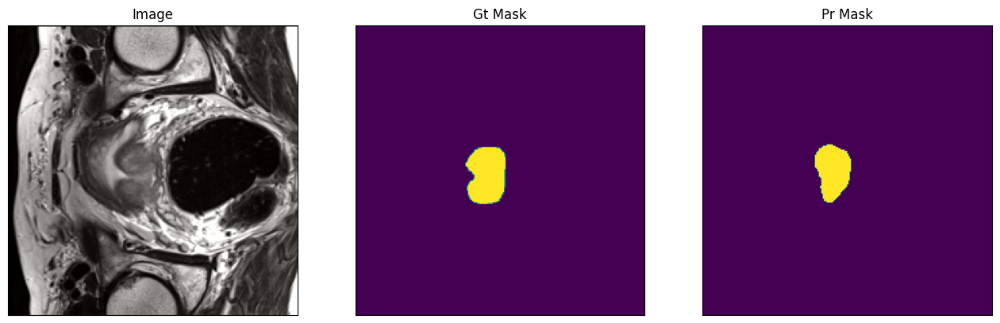

1/1 [==============================] - 0s 22ms/step


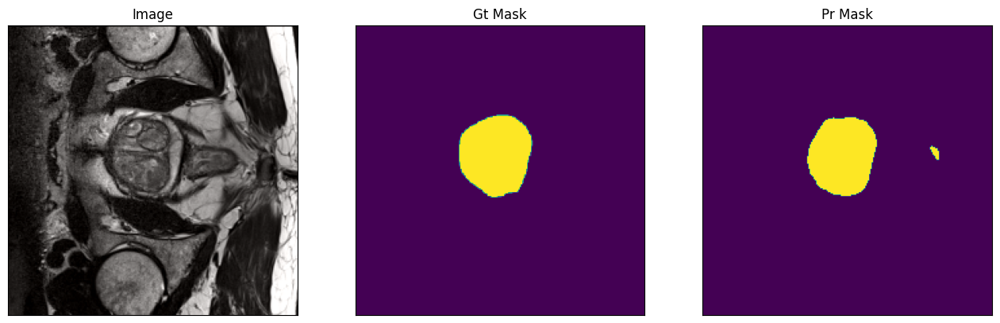

1/1 [==============================] - 0s 25ms/step


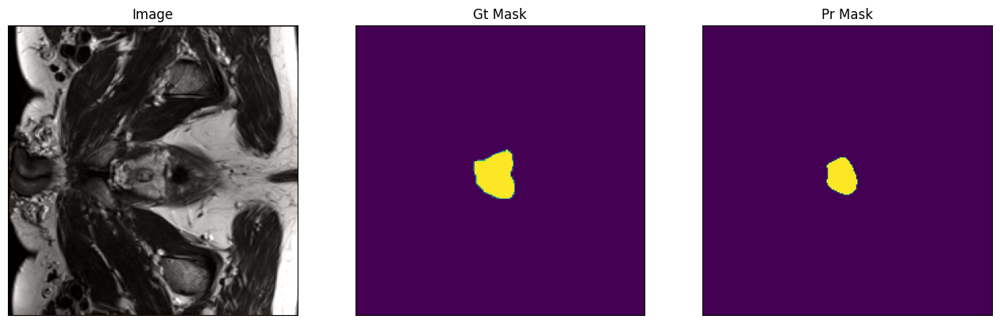

1/1 [==============================] - 0s 22ms/step


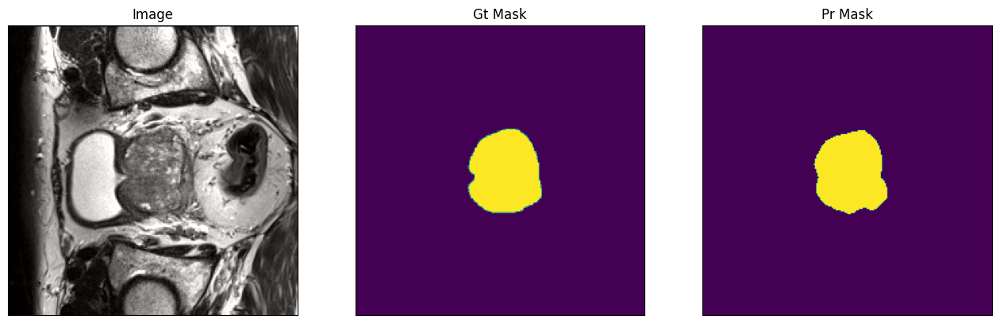

1/1 [==============================] - 0s 21ms/step


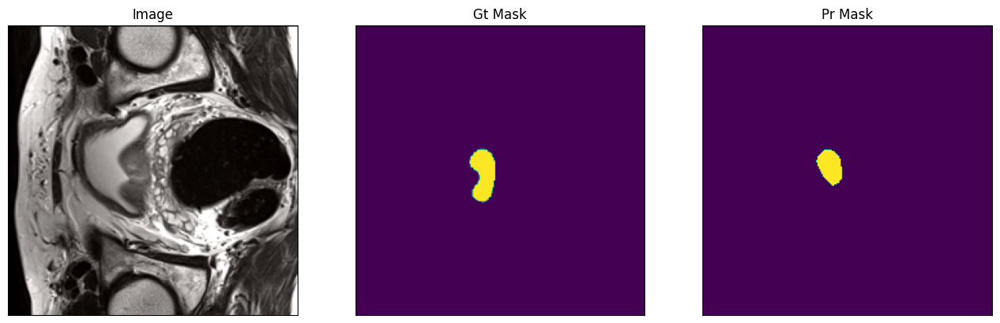

In [ ]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in ids:

    image, gt_mask = test_dataset[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model1.predict(image).round()

    visualize(
        image=denormalize(image.squeeze()),
        gt_mask=gt_mask[..., 0].squeeze(),
        pr_mask=pr_mask[..., 0].squeeze(),)



---



### Testing the Loader

In [ ]:
from keras.models import load_model

In [ ]:
load_model1 = load_model(local_path+"Training_Data/Saved_Models/models/A/vgg19_A_50epochs.hdf5", compile=False)

In [ ]:
load_model1 = load_model(local_path+"Training_Data/Saved_Models/models/A/vgg19_A_50epochs.hdf5",
                         custom_objects={'dice_loss_plus_1binary_focal_loss': total_loss,
                                         'iou_score':sm.metrics.IOUScore(threshold=0.5),
                                         'f1-score':sm.metrics.FScore(threshold=0.5)})

In [ ]:
from keras.metrics import MeanIoU

### VGG19 Training on Site B Dataset

In [ ]:
SITE = "B"
callbacks_site_B_vgg19 = create_callbacks(local_path = local_path, site=SITE, backbone= BACKBONE1, epoch=epoch, lr=LR)

In [ ]:
# Dataset for train images
train_dataset_B = Dataset(
    B_train_img_dir,
    B_train_mask_dir,
    preprocessing=preprocess_input1,
)

# Dataset for validation images
valid_dataset_B = Dataset(
    B_val_img_dir,
    B_val_mask_dir,
    preprocessing=preprocess_input1,
)

# Initialize dataloaders
train_dataloader_B = Dataloader(train_dataset_B, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader_B = Dataloader(valid_dataset_B, batch_size=1, shuffle=False)

In [ ]:
# train model
history1B = model1.fit_generator(
    train_dataloader_B,
    steps_per_epoch=len(train_dataloader_B),
    epochs=epoch,
    callbacks=callbacks_site_B_vgg19,
    validation_data=valid_dataloader_B,
    validation_steps=len(valid_dataloader_B),
)

<ipython-input-102-9dc2827719f9>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history1B = model1.fit_generator(


Epoch 1/50
26/26 [==============================] - 6s 220ms/step - loss: 0.3088 - iou_score: 0.5994 - f1-score: 0.7443 - val_loss: 0.9167 - val_iou_score: 0.0864 - val_f1-score: 0.1481
Epoch 2/50
26/26 [==============================] - 4s 167ms/step - loss: 0.3218 - iou_score: 0.5909 - f1-score: 0.7345 - val_loss: 1.0023 - val_iou_score: 0.2074 - val_f1-score: 0.3360
Epoch 3/50
26/26 [==============================] - 5s 202ms/step - loss: 0.3203 - iou_score: 0.5933 - f1-score: 0.7380 - val_loss: 0.3865 - val_iou_score: 0.5325 - val_f1-score: 0.6695
Epoch 4/50
26/26 [==============================] - 4s 163ms/step - loss: 0.3203 - iou_score: 0.5870 - f1-score: 0.7323 - val_loss: 0.4437 - val_iou_score: 0.4556 - val_f1-score: 0.5959
Epoch 5/50
26/26 [==============================] - 5s 202ms/step - loss: 0.3090 - iou_score: 0.6002 - f1-score: 0.7446 - val_loss: 0.5952 - val_iou_score: 0.3814 - val_f1-score: 0.5402
Epoch 6/50
26/26 [==============================] - 6s 215ms/step - lo

In [ ]:
save_model(local_path = local_path, site = SITE, backbone = BACKBONE1 , model = model1, epoch = epoch, lr=LR )

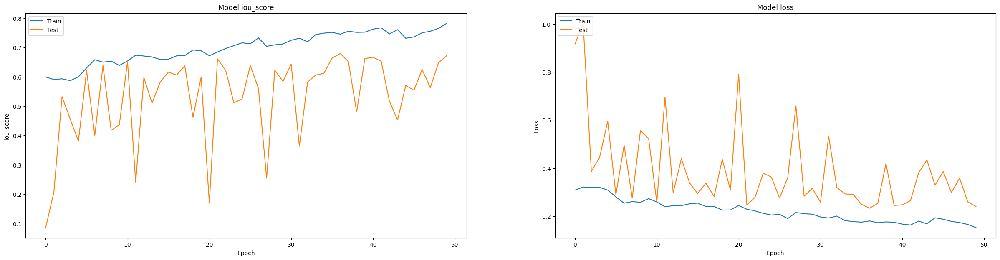

In [ ]:
plot_history(history= history1B)

In [ ]:
test_dataset = Dataset(
    B_test_img_dir,
    B_test_mask_dir,
    preprocessing=preprocess_input1,
)

test_dataloader = Dataloader(test_dataset, batch_size=1, shuffle=False)

In [ ]:
# load best weights
model1.load_weights(local_path+'Saved_Models/callbacks/Site_B/vgg19_model_without_EarlyStopping_LR00001.h5')

In [ ]:
scores = model1.evaluate_generator(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print("mean {}: {:.5}".format(metric.__name__, value))

<ipython-input-18-8856f6f7a017>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  scores = model1.evaluate_generator(test_dataloader)


Loss: 0.29092
mean iou_score: 0.62448
mean f1-score: 0.74278


1/1 [==============================] - 0s 397ms/step


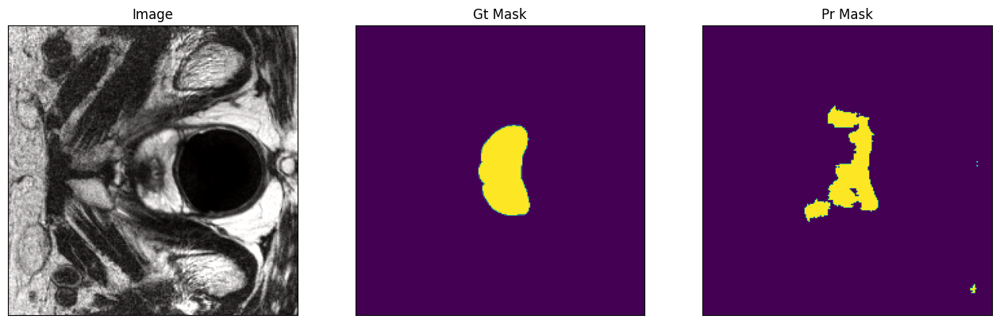

1/1 [==============================] - 0s 35ms/step


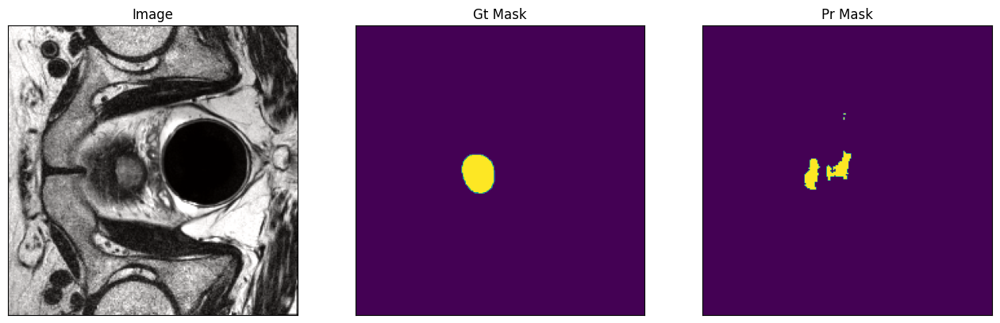

1/1 [==============================] - 0s 27ms/step


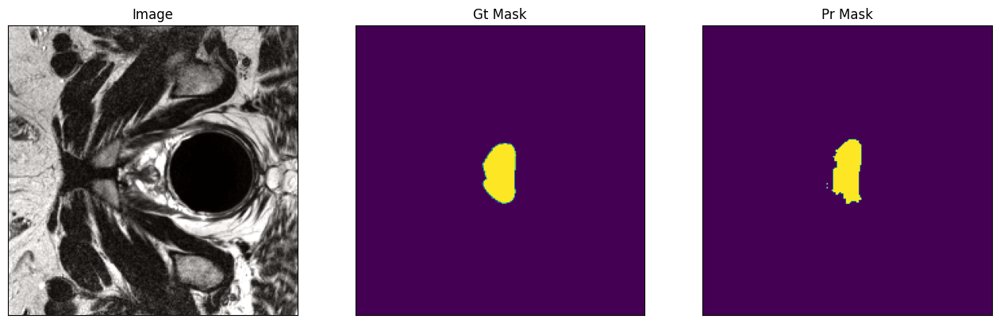

1/1 [==============================] - 0s 25ms/step


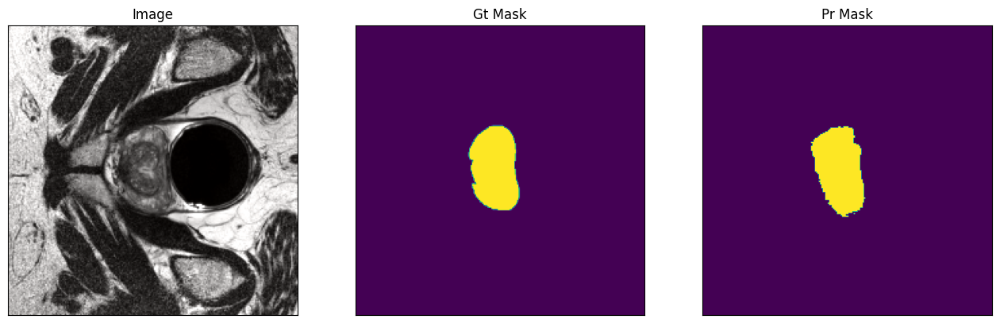

1/1 [==============================] - 0s 32ms/step


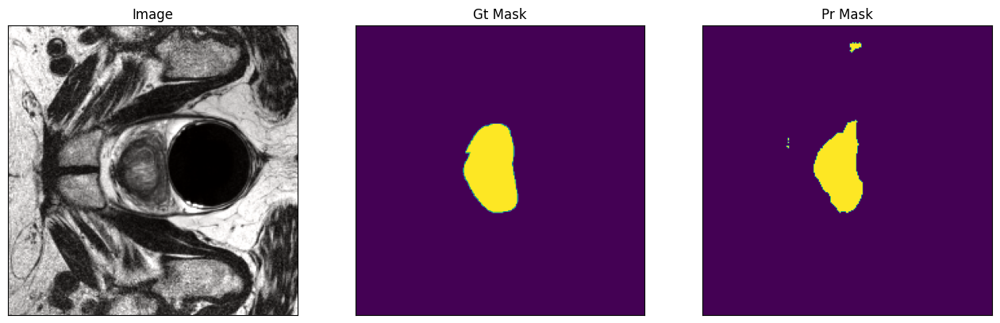

In [ ]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in ids:

    image, gt_mask = test_dataset[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model1.predict(image).round()

    visualize(
        image=denormalize(image.squeeze()),
        gt_mask=gt_mask[..., 0].squeeze(),
        pr_mask=pr_mask[..., 0].squeeze(),)

## ResNet50

In [83]:
BACKBONE2 = 'resnet50'
preprocess_input2 = sm.get_preprocessing(BACKBONE2)

In [84]:
#create model
model2 = sm.Unet(BACKBONE2, classes=n_classes, activation=activation, encoder_weights='imagenet')
#compile keras model with defined optimizer, loss and metrics
# # Use legacy optimizer
# optim = keras.optimizers.legacy.Adam(LR)

# Build optimizer with trainable variables
# optim.build(model2.trainable_variables)

model2.compile(optim, total_loss, metrics)
# print(model1.summary())

### ResNet50 Training on Site A Dataset

In [15]:
SITE = "A"
callbacks_site_A_resnet50 = create_callbacks(local_path = local_path, site= SITE, backbone= BACKBONE2, epoch=epoch, lr=LR)

In [16]:
# Dataset for train images
train_dataset_A = Dataset(
    A_train_img_dir,
    A_train_mask_dir,
    preprocessing=preprocess_input2,
)

# Dataset for validation images
valid_dataset_A = Dataset(
    A_val_img_dir,
    A_val_mask_dir,
    preprocessing=preprocess_input2,
)

# Initialize dataloaders
train_dataloader_A = Dataloader(train_dataset_A, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader_A = Dataloader(valid_dataset_A, batch_size=1, shuffle=False)


In [17]:
history2A =  model2.fit_generator(
    train_dataloader_A,
    steps_per_epoch=len(train_dataloader_A),
    epochs=epoch,
    callbacks=callbacks_site_A_resnet50,
    validation_data=valid_dataloader_A,
    validation_steps=len(valid_dataloader_A),
)

<ipython-input-17-24ce65cf4190>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history2A =  model2.fit_generator(


Epoch 1/34
25/25 [==============================] - 135s 4s/step - loss: 0.7313 - iou_score: 0.4323 - f1-score: 0.5755 - val_loss: 9.4011 - val_iou_score: 0.0447 - val_f1-score: 0.0849
Epoch 2/34
25/25 [==============================] - 7s 288ms/step - loss: 0.3883 - iou_score: 0.6404 - f1-score: 0.7761 - val_loss: 3.3607 - val_iou_score: 0.0618 - val_f1-score: 0.1147
Epoch 3/34
25/25 [==============================] - 6s 243ms/step - loss: 0.2419 - iou_score: 0.7073 - f1-score: 0.8247 - val_loss: 1.8286 - val_iou_score: 0.0439 - val_f1-score: 0.0831
Epoch 4/34
25/25 [==============================] - 5s 191ms/step - loss: 0.1736 - iou_score: 0.7695 - f1-score: 0.8680 - val_loss: 1.9673 - val_iou_score: 0.1526 - val_f1-score: 0.2572
Epoch 5/34
25/25 [==============================] - 6s 238ms/step - loss: 0.1989 - iou_score: 0.7265 - f1-score: 0.8373 - val_loss: 6.1378 - val_iou_score: 0.0574 - val_f1-score: 0.1075
Epoch 6/34
25/25 [==============================] - 6s 229ms/step - los

In [18]:
save_model(local_path = local_path,site = SITE, backbone = BACKBONE2 , model = model2, epoch = epoch, lr=LR )

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


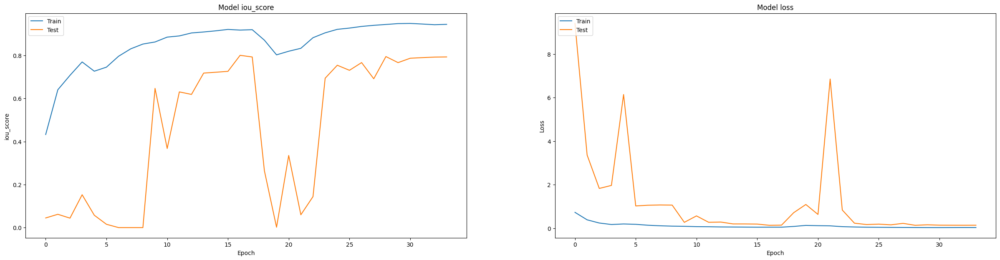

In [19]:
plot_history(history= history2A)

In [20]:
test_dataset = Dataset(
    A_test_img_dir,
    A_test_mask_dir,
    preprocessing=preprocess_input2,
)

test_dataloader = Dataloader(test_dataset, batch_size=1, shuffle=False)

In [21]:
# load best weights
model2.load_weights(local_path+'Saved_Models/callbacks/Site_A/resnet50_model_A_34epoch_LR0001.h5')

In [22]:
scores = model2.evaluate_generator(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print("mean {}: {:.5}".format(metric.__name__, value))

<ipython-input-22-01bd3e2efe2e>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  scores = model2.evaluate_generator(test_dataloader)


Loss: 0.13569
mean iou_score: 0.79542
mean f1-score: 0.88085


1/1 [==============================] - 2s 2s/step


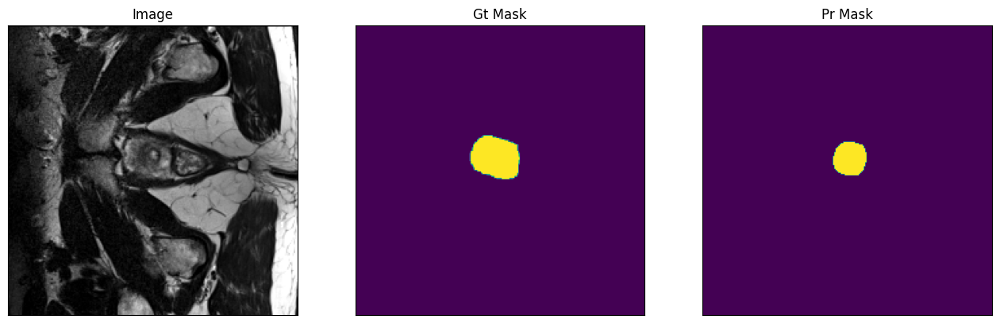

1/1 [==============================] - 0s 29ms/step


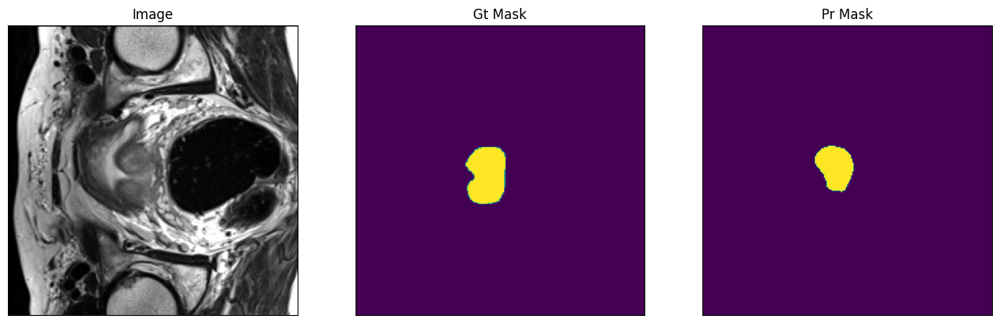

1/1 [==============================] - 0s 24ms/step


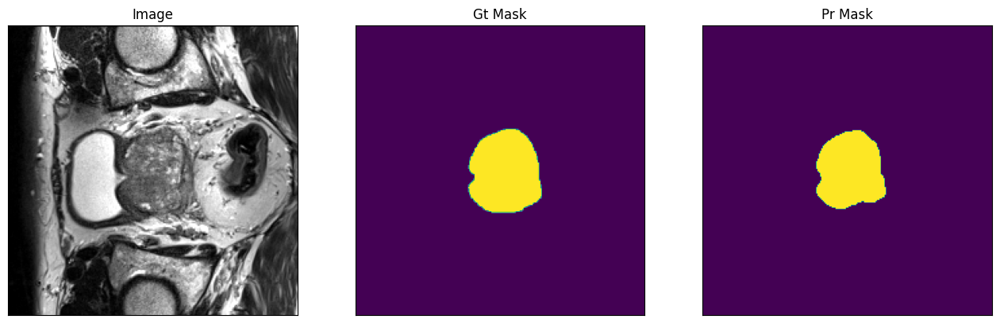

1/1 [==============================] - 0s 37ms/step


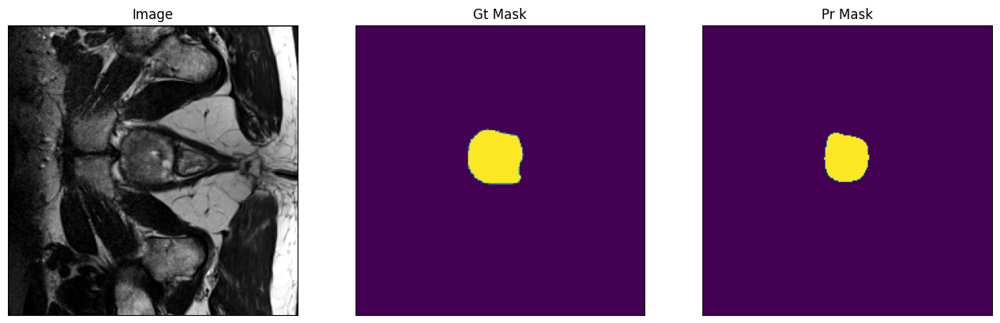

1/1 [==============================] - 0s 25ms/step


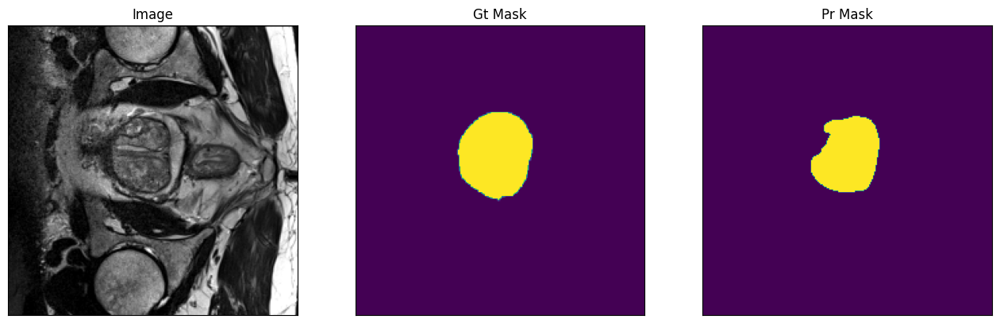

In [23]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in ids:

    image, gt_mask = test_dataset[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model2.predict(image).round()

    visualize(
        image=denormalize(image.squeeze()),
        gt_mask=gt_mask[..., 0].squeeze(),
        pr_mask=pr_mask[..., 0].squeeze(),)

### ResNet50 Training on Site B Dataset

In [85]:
SITE = "B"
callbacks_site_B_resnet50 = create_callbacks(local_path = local_path, site= SITE, backbone= BACKBONE2, epoch=epoch, lr=LR)

In [86]:
# Dataset for train images
train_dataset_B = Dataset(
    B_train_img_dir,
    B_train_mask_dir,
    preprocessing=preprocess_input2,
)

# Dataset for validation images
valid_dataset_B = Dataset(
    B_val_img_dir,
    B_val_mask_dir,
    preprocessing=preprocess_input2,
)

# Initialize dataloaders
train_dataloader_B = Dataloader(train_dataset_B, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader_B = Dataloader(valid_dataset_B, batch_size=1, shuffle=False)

In [87]:
# train model
history2B = model2.fit_generator(
    train_dataloader_B,
    steps_per_epoch=len(train_dataloader_B),
    epochs=epoch,
    callbacks=callbacks_site_B_resnet50,
    validation_data=valid_dataloader_B,
    validation_steps=len(valid_dataloader_B),
)

<ipython-input-87-fc62dc7e5f3e>:2: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history2B = model2.fit_generator(


Epoch 1/13
26/26 [==============================] - 36s 273ms/step - loss: 0.7888 - iou_score: 0.4415 - f1-score: 0.5817 - val_loss: 1.7470 - val_iou_score: 0.1131 - val_f1-score: 0.1996
Epoch 2/13
26/26 [==============================] - 5s 199ms/step - loss: 0.4669 - iou_score: 0.6444 - f1-score: 0.7795 - val_loss: 1.2512 - val_iou_score: 0.2071 - val_f1-score: 0.3368
Epoch 3/13
26/26 [==============================] - 5s 200ms/step - loss: 0.3070 - iou_score: 0.6608 - f1-score: 0.7917 - val_loss: 7.8500 - val_iou_score: 0.0547 - val_f1-score: 0.1031
Epoch 4/13
26/26 [==============================] - 4s 164ms/step - loss: 0.2220 - iou_score: 0.7223 - f1-score: 0.8363 - val_loss: 6.9290 - val_iou_score: 0.0550 - val_f1-score: 0.1038
Epoch 5/13
26/26 [==============================] - 4s 160ms/step - loss: 0.2060 - iou_score: 0.7285 - f1-score: 0.8393 - val_loss: 6.5227 - val_iou_score: 0.0369 - val_f1-score: 0.0704
Epoch 6/13
26/26 [==============================] - 5s 191ms/step - l

In [89]:
save_model(local_path = local_path, site = SITE, backbone = BACKBONE2 , model = model2, epoch = epoch, lr=LR )

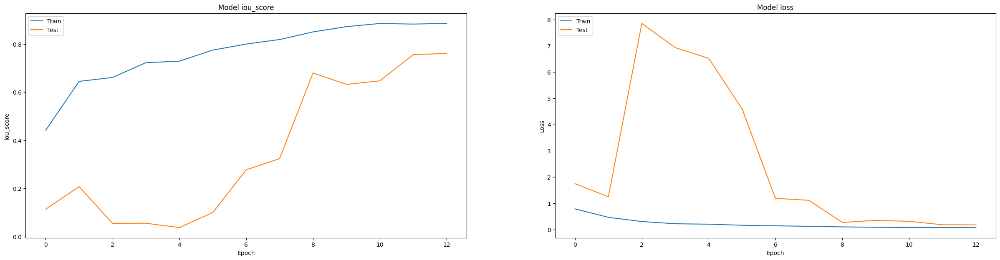

In [90]:
plot_history(history= history2B)

In [92]:
test_dataset = Dataset(
    B_test_img_dir,
    B_test_mask_dir,
    preprocessing=preprocess_input2,
)

test_dataloader = Dataloader(test_dataset, batch_size=1, shuffle=False)

In [94]:
# load best weights
model2.load_weights(local_path+f'Saved_Models/callbacks/Site_B/resnet50_model_B_13epoch_LR0001.h5')

In [95]:
scores = model2.evaluate_generator(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print("mean {}: {:.5}".format(metric.__name__, value))

<ipython-input-95-01bd3e2efe2e>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  scores = model2.evaluate_generator(test_dataloader)


Loss: 0.21704
mean iou_score: 0.73127
mean f1-score: 0.81857


1/1 [==============================] - 1s 1s/step


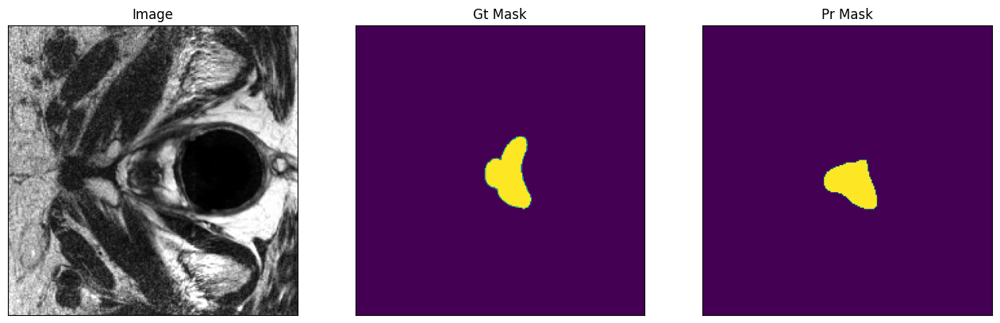

1/1 [==============================] - 0s 62ms/step


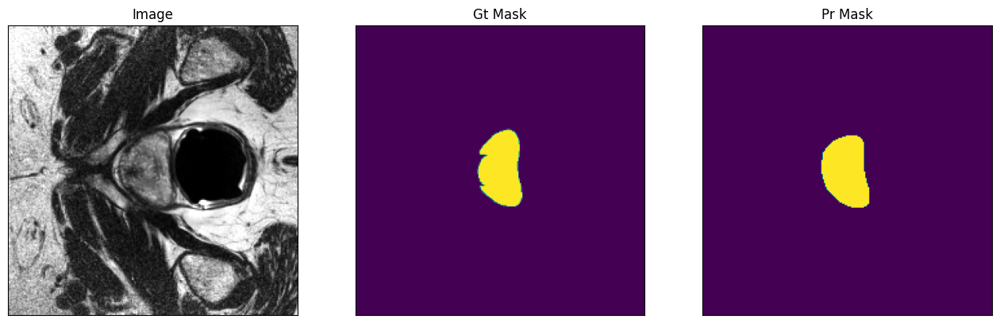

1/1 [==============================] - 0s 26ms/step


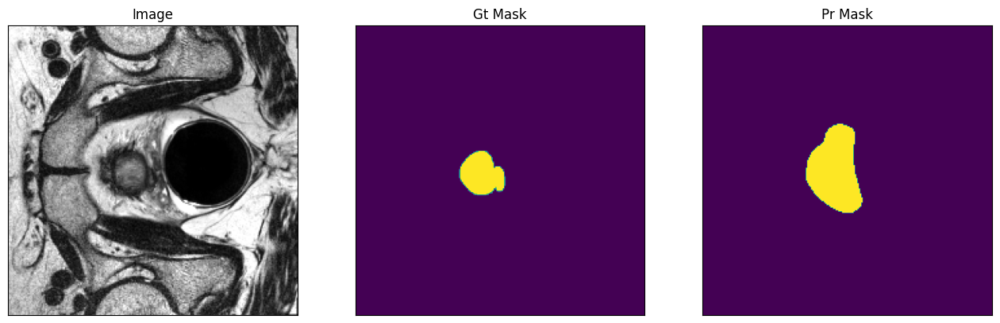

1/1 [==============================] - 0s 27ms/step


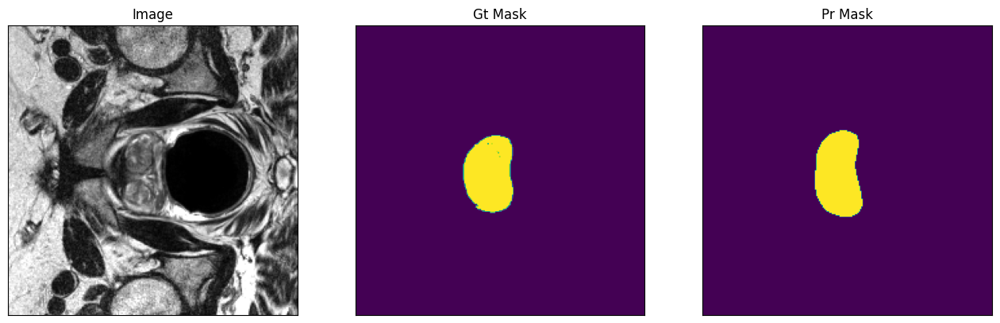

1/1 [==============================] - 0s 28ms/step


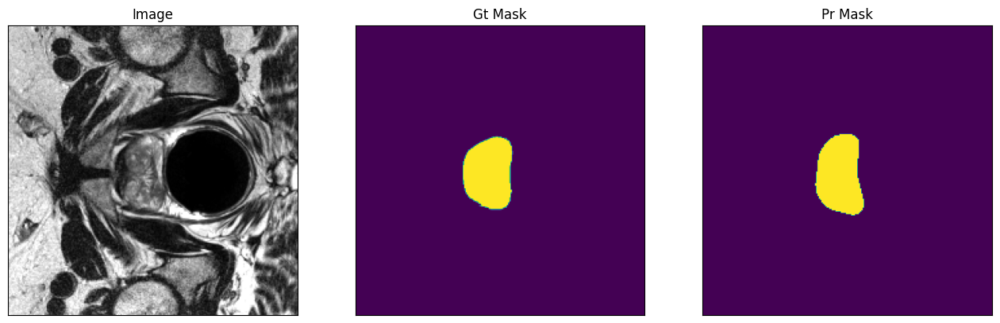

In [96]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in ids:

    image, gt_mask = test_dataset[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model2.predict(image).round()

    visualize(
        image=denormalize(image.squeeze()),
        gt_mask=gt_mask[..., 0].squeeze(),
        pr_mask=pr_mask[..., 0].squeeze(),)

## EfficientNetB0

In [165]:
BACKBONE3 = 'efficientnetb0'
preprocess_input3 = sm.get_preprocessing(BACKBONE3)

In [166]:
#create model
model3 = sm.Unet(BACKBONE3, classes=n_classes, activation=activation, encoder_weights='imagenet')
#compile keras model with defined optimizer, loss and metrics
model3.compile(optim, total_loss, metrics)
# print(model1.summary())

## Efficientnetb0 Training on Site A Dataset

In [113]:
SITE = 'A'
callbacks_site_A_efficientnetb0 = create_callbacks(local_path = local_path, site= SITE, backbone= BACKBONE3, epoch=epoch, lr=LR)

In [114]:
# Dataset for train images
train_dataset_A = Dataset(
    A_train_img_dir,
    A_train_mask_dir,
    preprocessing=preprocess_input3,
)

# Dataset for validation images
valid_dataset_A = Dataset(
    A_val_img_dir,
    A_val_mask_dir,
    preprocessing=preprocess_input3,
)

# Initialize dataloaders
train_dataloader_A = Dataloader(train_dataset_A, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader_A = Dataloader(valid_dataset_A, batch_size=1, shuffle=False)


In [116]:
history3A =  model3.fit_generator(
    train_dataloader_A,
    steps_per_epoch=len(train_dataloader_A),
    epochs=epoch,
    callbacks=callbacks_site_A_efficientnetb0,
    validation_data=valid_dataloader_A,
    validation_steps=len(valid_dataloader_A),
)

Epoch 1/13


<ipython-input-116-0f1edd6a70aa>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history3A =  model3.fit_generator(


25/25 [==============================] - 35s 331ms/step - loss: 0.9176 - iou_score: 0.3487 - f1-score: 0.4739 - val_loss: 5.4813 - val_iou_score: 0.0617 - val_f1-score: 0.1148
Epoch 2/13
25/25 [==============================] - 6s 234ms/step - loss: 0.6061 - iou_score: 0.6748 - f1-score: 0.8008 - val_loss: 1.3401 - val_iou_score: 0.1391 - val_f1-score: 0.2396
Epoch 3/13
25/25 [==============================] - 6s 238ms/step - loss: 0.3350 - iou_score: 0.7677 - f1-score: 0.8663 - val_loss: 1.7105 - val_iou_score: 0.1860 - val_f1-score: 0.3081
Epoch 4/13
25/25 [==============================] - 6s 253ms/step - loss: 0.2191 - iou_score: 0.7638 - f1-score: 0.8630 - val_loss: 4.2664 - val_iou_score: 0.0694 - val_f1-score: 0.1284
Epoch 5/13
25/25 [==============================] - 5s 185ms/step - loss: 0.1665 - iou_score: 0.7923 - f1-score: 0.8828 - val_loss: 1.4532 - val_iou_score: 0.1582 - val_f1-score: 0.2675
Epoch 5: early stopping


In [117]:
save_model(local_path = local_path, site = SITE, backbone = BACKBONE3 , model = model3, epoch = epoch, lr=LR )

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


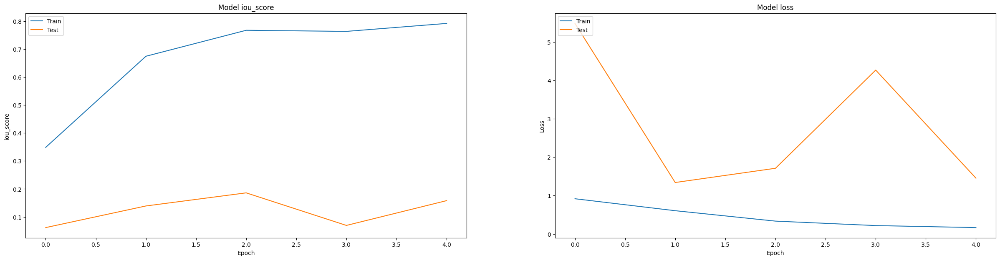

In [119]:
plot_history(history= history3A)

In [120]:
test_dataset = Dataset(
    A_test_img_dir,
    A_test_mask_dir,
    preprocessing=preprocess_input3,
)

test_dataloader = Dataloader(test_dataset, batch_size=1, shuffle=False)

In [121]:
# load best weights
model3.load_weights(local_path+'Saved_Models/callbacks/Site_A/efficientnetb0_model_A_5epoch_LR0001.h5')

In [122]:
scores = model3.evaluate_generator(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print("mean {}: {:.5}".format(metric.__name__, value))

<ipython-input-122-d3352dfb4ea0>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  scores = model3.evaluate_generator(test_dataloader)


Loss: 1.3296
mean iou_score: 0.12996
mean f1-score: 0.22632


1/1 [==============================] - 1s 1s/step


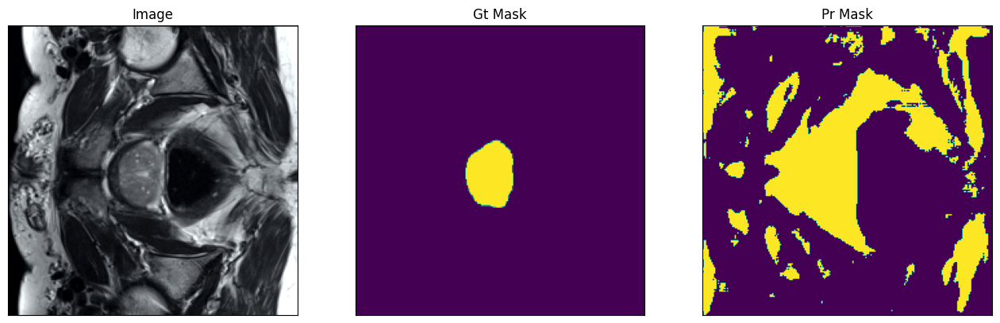

1/1 [==============================] - 0s 30ms/step


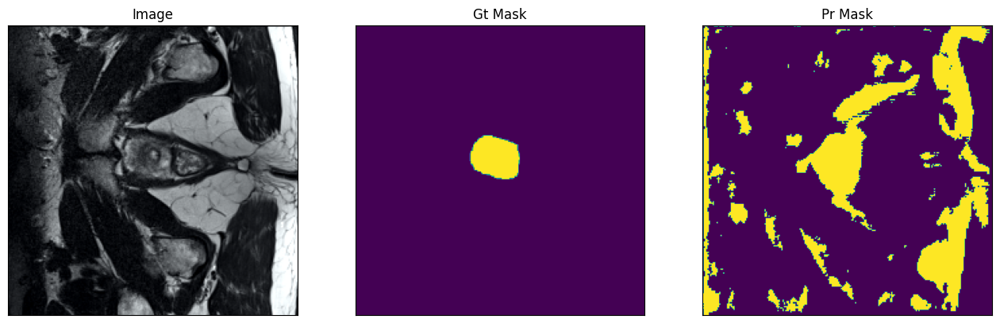

1/1 [==============================] - 0s 32ms/step


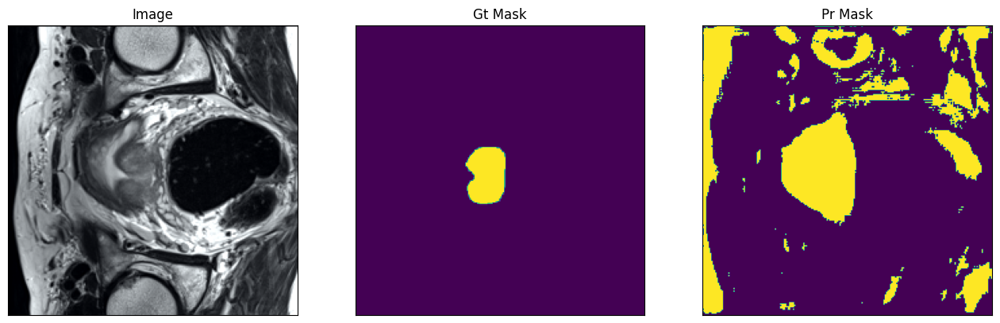

1/1 [==============================] - 0s 48ms/step


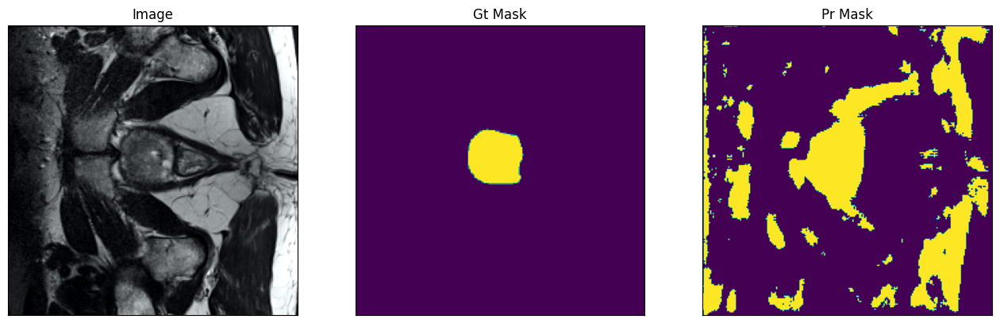

1/1 [==============================] - 0s 29ms/step


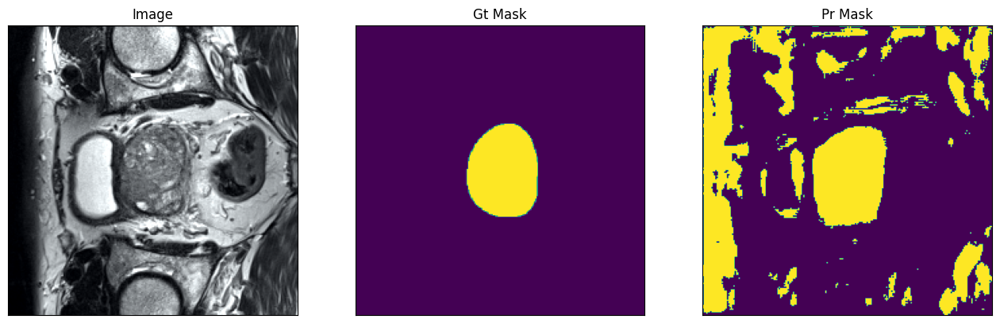

In [123]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in ids:

    image, gt_mask = test_dataset[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model3.predict(image).round()

    visualize(
        image=denormalize(image.squeeze()),
        gt_mask=gt_mask[..., 0].squeeze(),
        pr_mask=pr_mask[..., 0].squeeze(),)

## Efficientnetb0 Training on Site B Dataset

In [167]:
SITE = 'B'
callbacks_site_B_efficientnetb0 = create_callbacks(local_path = local_path, site= SITE, backbone= BACKBONE3, epoch=epoch, lr=LR)

In [168]:
# Dataset for train images
train_dataset_B = Dataset(
    B_train_img_dir,
    B_train_mask_dir,
    preprocessing=preprocess_input3,
)

# Dataset for validation images
valid_dataset_B = Dataset(
    B_val_img_dir,
    B_val_mask_dir,
    preprocessing=preprocess_input3,
)

# Initialize dataloaders
train_dataloader_B = Dataloader(train_dataset_B, batch_size=BATCH_SIZE, shuffle=True)
valid_dataloader_B = Dataloader(valid_dataset_B, batch_size=1, shuffle=False)


In [169]:
history3B =  model3.fit_generator(
    train_dataloader_B,
    steps_per_epoch=len(train_dataloader_B),
    epochs=epoch,
    callbacks=callbacks_site_B_efficientnetb0,
    validation_data=valid_dataloader_B,
    validation_steps=len(valid_dataloader_B),
)

<ipython-input-169-3ed1474fb574>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history3B =  model3.fit_generator(


Epoch 1/34
26/26 [==============================] - 49s 326ms/step - loss: 1.1738 - iou_score: 0.0619 - f1-score: 0.1154 - val_loss: 3.5109 - val_iou_score: 0.0391 - val_f1-score: 0.0750
Epoch 2/34
26/26 [==============================] - 8s 307ms/step - loss: 1.0043 - iou_score: 0.1008 - f1-score: 0.1811 - val_loss: 2.3187 - val_iou_score: 0.0419 - val_f1-score: 0.0802
Epoch 3/34
26/26 [==============================] - 6s 246ms/step - loss: 0.9280 - iou_score: 0.1804 - f1-score: 0.3003 - val_loss: 1.3999 - val_iou_score: 0.0515 - val_f1-score: 0.0974
Epoch 4/34
26/26 [==============================] - 7s 287ms/step - loss: 0.8797 - iou_score: 0.3511 - f1-score: 0.5102 - val_loss: 1.1515 - val_iou_score: 0.0697 - val_f1-score: 0.1295
Epoch 5/34
26/26 [==============================] - 6s 229ms/step - loss: 0.8470 - iou_score: 0.5731 - f1-score: 0.7203 - val_loss: 1.0155 - val_iou_score: 0.1618 - val_f1-score: 0.2750
Epoch 6/34
26/26 [==============================] - 8s 318ms/step - l

In [170]:
save_model(local_path = local_path, site = SITE, backbone = BACKBONE3 , model = model3, epoch = epoch, lr=LR )

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


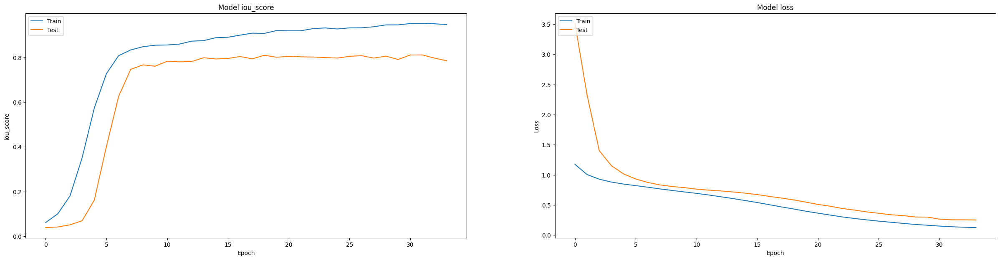

In [171]:
plot_history(history= history3B)

In [172]:
test_dataset = Dataset(
    B_test_img_dir,
    B_test_mask_dir,
    preprocessing=preprocess_input3,
)

test_dataloader = Dataloader(test_dataset, batch_size=1, shuffle=False)

In [173]:
# load best weights
model3.load_weights(local_path+'Saved_Models/callbacks/Site_B/efficientnetb0_model_B_34epoch_LR00001.h5')

In [174]:
scores = model3.evaluate_generator(test_dataloader)

print("Loss: {:.5}".format(scores[0]))
for metric, value in zip(metrics, scores[1:]):
    print("mean {}: {:.5}".format(metric.__name__, value))

<ipython-input-174-d3352dfb4ea0>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  scores = model3.evaluate_generator(test_dataloader)


Loss: 0.31722
mean iou_score: 0.71212
mean f1-score: 0.81236


1/1 [==============================] - 1s 1s/step


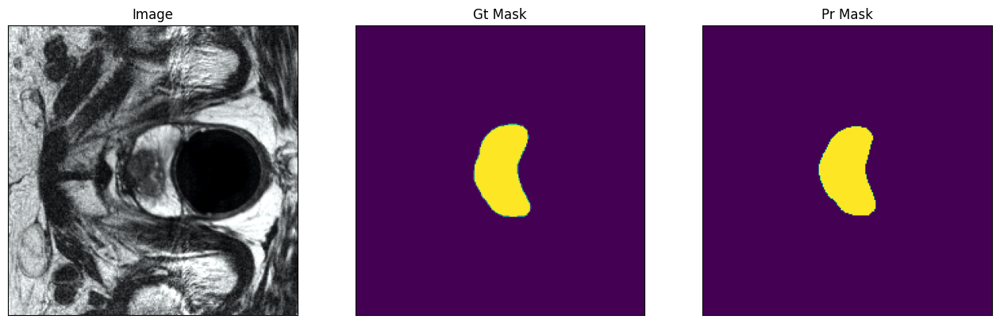

1/1 [==============================] - 0s 31ms/step


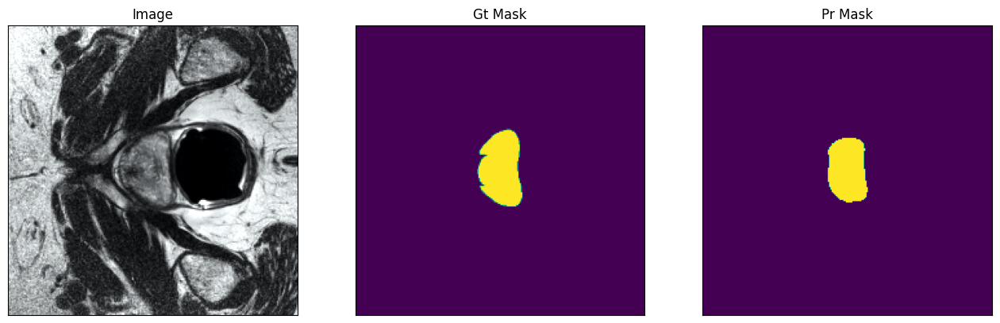

1/1 [==============================] - 0s 68ms/step


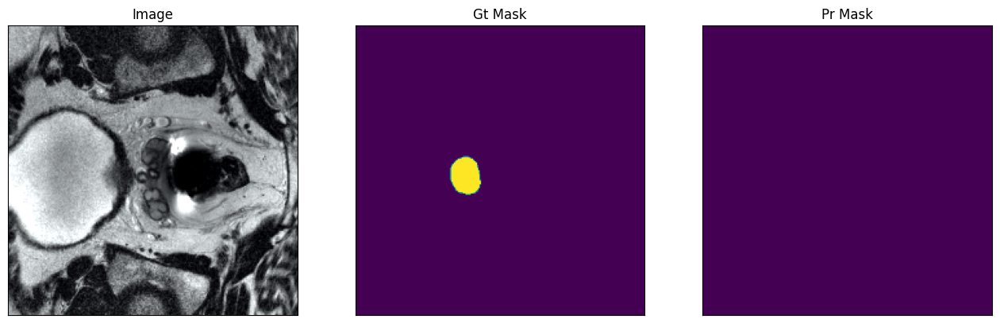

1/1 [==============================] - 0s 67ms/step


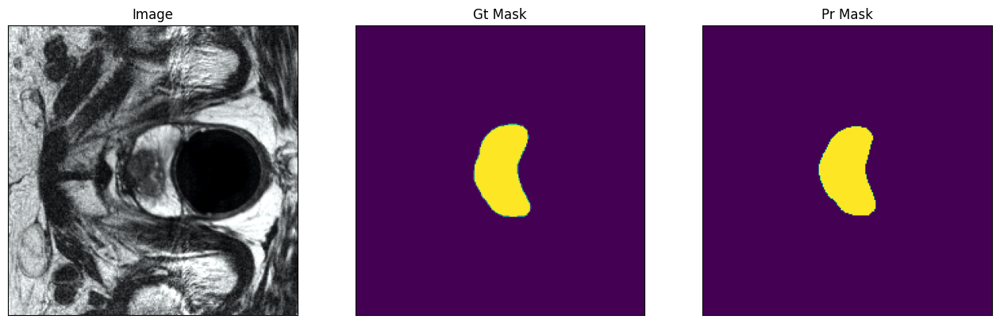

1/1 [==============================] - 0s 41ms/step


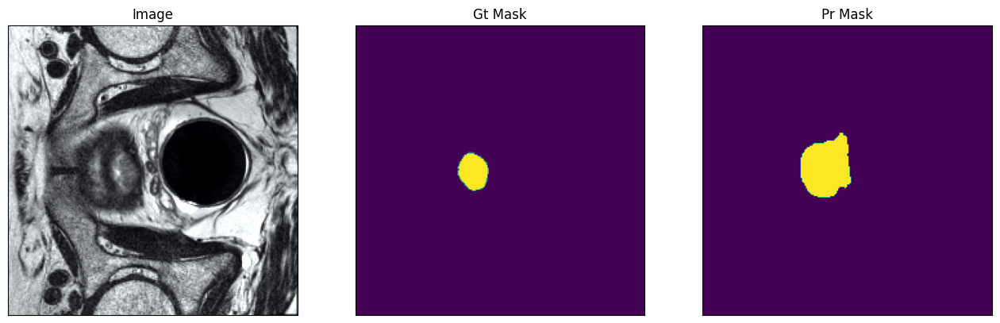

In [161]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset)), size=n)

for i in ids:

    image, gt_mask = test_dataset[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = model3.predict(image).round()

    visualize(
        image=denormalize(image.squeeze()),
        gt_mask=gt_mask[..., 0].squeeze(),
        pr_mask=pr_mask[..., 0].squeeze(),)

# Testing the trained models for Cross-Site Comparision

In [175]:
from keras.models import load_model

In [176]:
best_model_A_path = "Saved_Models/models/Site_A/efficientnetb0_A_13epochs_LR0001_without_EarlyStopping_best.hdf5"
best_model_B_path = "Saved_Models/models/Site_B/efficientnetb0_B_17epochs_LR0001_best.hdf5"

In [177]:
best_weights_A_path = "Saved_Models/callbacks/Site_A/efficientnetb0_model_A_13epoch_LR0001_without_EarlyStopping_best.h5"
best_weights_B_path = "Saved_Models/callbacks/Site_B/efficientnetb0_model_B_17epoch_LR0001_best.h5"

In [178]:
# Loading best Models on Sites
best_model_A = load_model(local_path+best_model_A_path, compile=False)
best_model_B = load_model(local_path+best_model_B_path, compile=False)

In [179]:
best_model_A = load_model(local_path+best_model_A_path,
                          custom_objects={'dice_loss_plus_1binary_focal_loss':total_loss,
                                          'iou_score':sm.metrics.IOUScore(threshold=0.5),
                                          'f1-score':sm.metrics.FScore(threshold=0.5)})

In [180]:
best_model_B = load_model(local_path+best_model_B_path,
                          custom_objects={'dice_loss_plus_1binary_focal_loss':total_loss,
                                          'iou_score':sm.metrics.IOUScore(threshold=0.5),
                                          'f1-score':sm.metrics.FScore(threshold=0.5)})

In [181]:
best_model_A.load_weights(local_path+best_weights_A_path)

In [182]:
best_model_B.load_weights(local_path+best_weights_B_path)

In [183]:
#Best Model Backbone for each site
BEST_BACKBONE_A = "efficientnetb0"
BEST_BACKBONE_B = "efficientnetb0"
# BACKBONE = "efficientnetb0"

In [184]:
input_preprocessor_A = sm.get_preprocessing(BEST_BACKBONE_A)
input_preprocessor_B = sm.get_preprocessing(BEST_BACKBONE_B)

In [185]:
# test dataloader for Site A is preprocessed wrt to the best model on dataset B
test_dataset_A = Dataset(
    A_test_img_dir,
    A_test_mask_dir,
    preprocessing= input_preprocessor_B,
)

test_dataloader_A = Dataloader(test_dataset_A, batch_size=1, shuffle=False)

In [186]:
# test dataloader for Site B is preprocessed wrt to the best model on dataset A
test_dataset_B = Dataset(
    B_test_img_dir,
    B_test_mask_dir,
    preprocessing= input_preprocessor_A,
)

test_dataloader_B = Dataloader(test_dataset_B, batch_size=1, shuffle=False)

In [187]:
scores_B = best_model_A.evaluate_generator(test_dataloader_B)

print("Loss: {:.5}".format(scores_B[0]))
for metric, value in zip(metrics, scores_B[1:]):
    print("mean {}: {:.5}".format(metric.__name__, value))

<ipython-input-187-9e24f74a0520>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  scores_B = best_model_A.evaluate_generator(test_dataloader_B)


Loss: 0.44312
mean iou_score: 0.47484
mean f1-score: 0.59214


In [188]:
scores_A = best_model_B.evaluate_generator(test_dataloader_A)

print("Loss: {:.5}".format(scores_A[0]))
for metric, value in zip(metrics, scores_A[1:]):
    print("mean {}: {:.5}".format(metric.__name__, value))

<ipython-input-188-a9fc2268c0dd>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  scores_A = best_model_B.evaluate_generator(test_dataloader_A)


Loss: 0.22654
mean iou_score: 0.70986
mean f1-score: 0.79992


1/1 [==============================] - 2s 2s/step


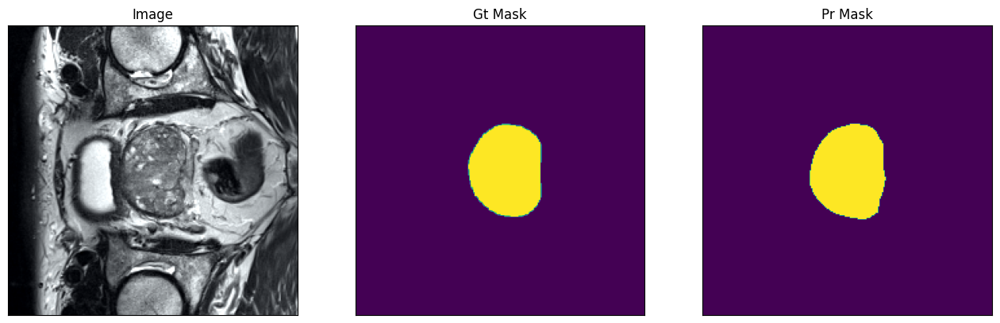

1/1 [==============================] - 0s 29ms/step


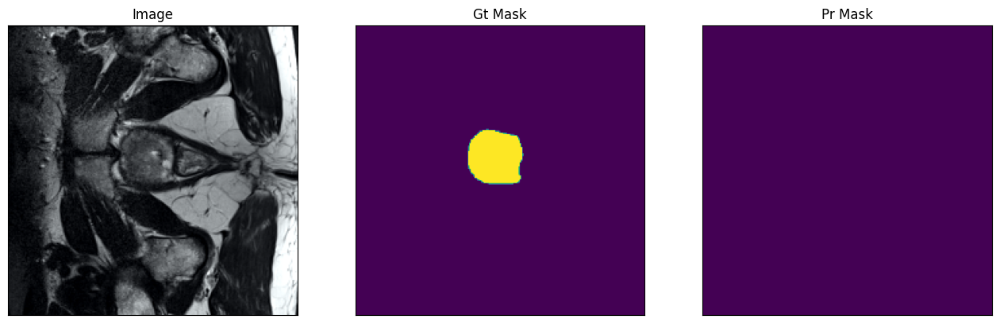

1/1 [==============================] - 0s 31ms/step


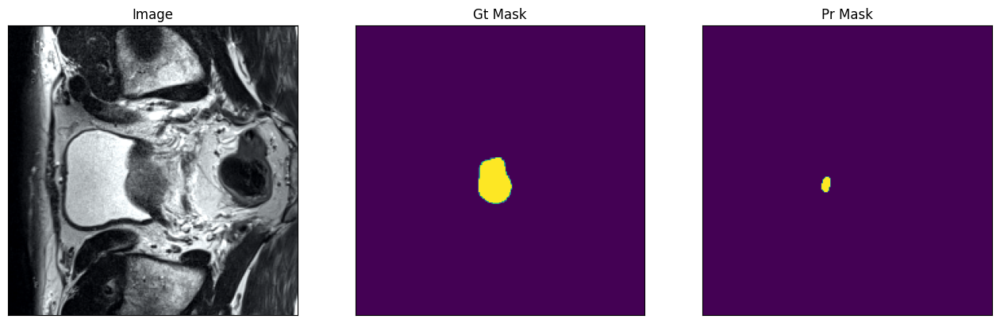

1/1 [==============================] - 0s 28ms/step


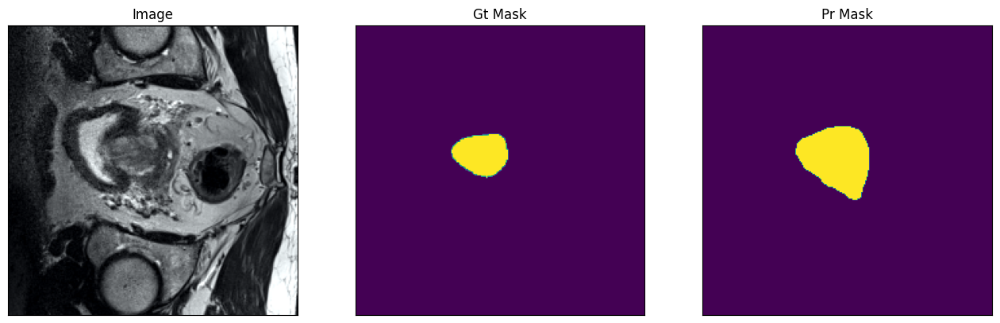

1/1 [==============================] - 0s 28ms/step


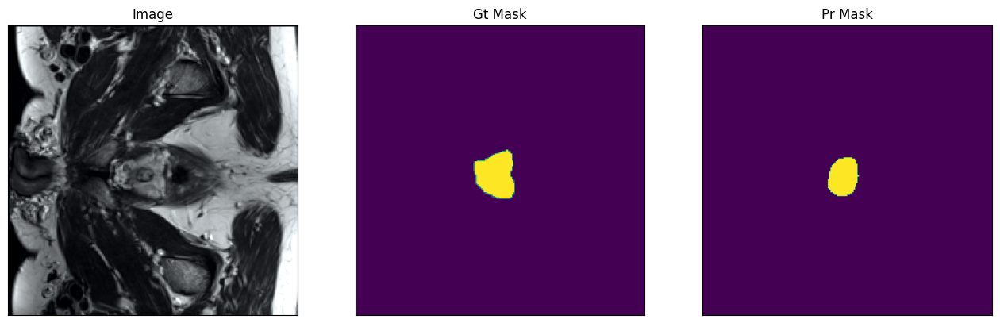

In [189]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset_A)), size=n)

for i in ids:

    image, gt_mask = test_dataset_A[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = best_model_B.predict(image).round()

    visualize(
        image=denormalize(image.squeeze()),
        gt_mask=gt_mask[..., 0].squeeze(),
        pr_mask=pr_mask[..., 0].squeeze(),)

1/1 [==============================] - 2s 2s/step


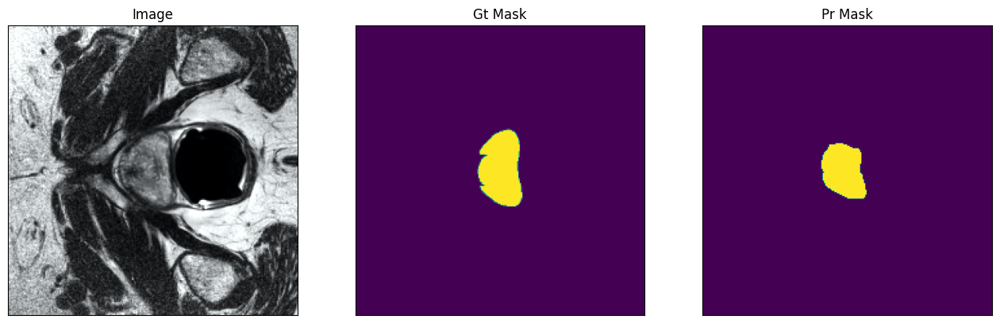

1/1 [==============================] - 0s 30ms/step


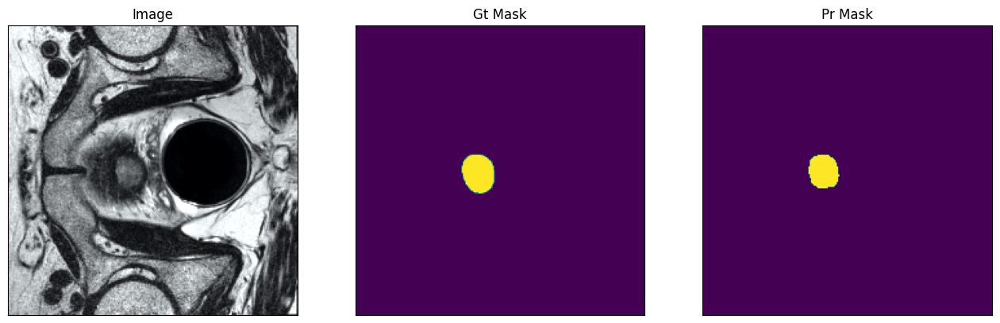

1/1 [==============================] - 0s 28ms/step


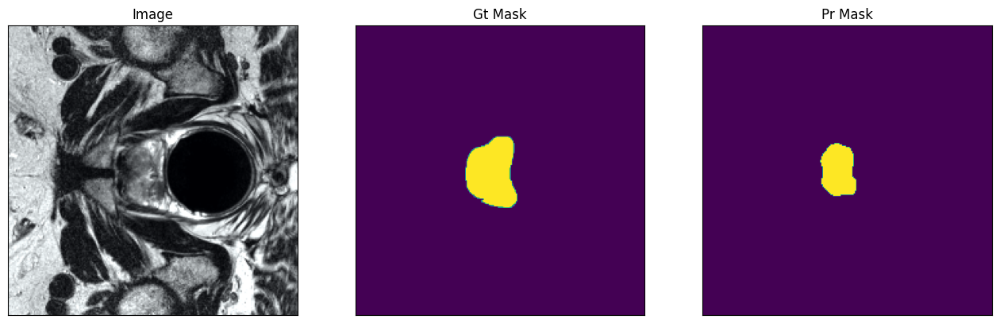

1/1 [==============================] - 0s 28ms/step


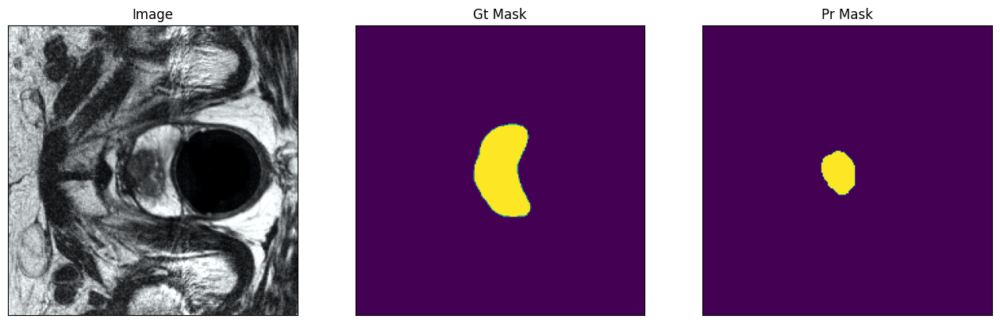

1/1 [==============================] - 0s 36ms/step


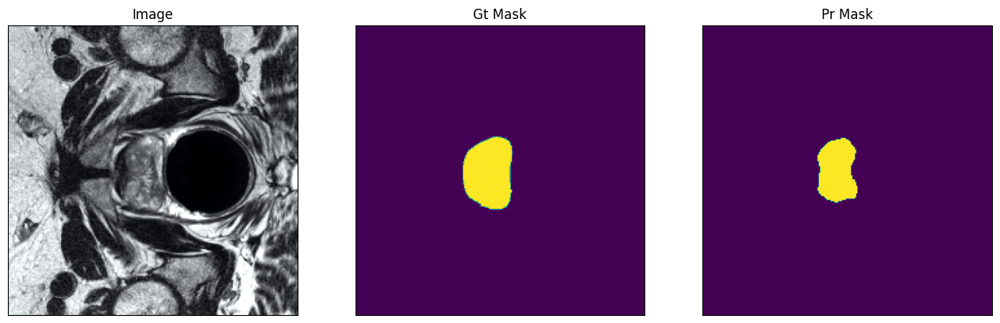

In [190]:
n = 5
ids = np.random.choice(np.arange(len(test_dataset_B)), size=n)

for i in ids:

    image, gt_mask = test_dataset_B[i]
    image = np.expand_dims(image, axis=0)
    pr_mask = best_model_A.predict(image).round()

    visualize(
        image=denormalize(image.squeeze()),
        gt_mask=gt_mask[..., 0].squeeze(),
        pr_mask=pr_mask[..., 0].squeeze(),)

In [ ]:
import pandas as pd

file_name = 'my_logs_vgg19_A_with_faulty_preprocessing'
log_file_path = local_path+f'Training_Data/Saved_Models/logs/Site_A/{file_name}.csv'
df = pd.read_csv(log_file_path)

In [ ]:
plt.plot(df['epoch'], df['loss'], label='Training Loss')
plt.plot(df['epoch'], df['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

In [11]:
import pandas as pd
import os
import re

def calculate_metric(df, column, func):
    """Calculate a metric if the column exists in the DataFrame."""
    return func(df[column]) if column in df.columns else None

def analyze_model_logs(base_path):
    """Analyze model logs and return a DataFrame with the results."""
    results_df = pd.DataFrame(columns=[
        'Site', 'Model', 'Learning Rate', 'Epochs', 
        'Max Val IOU Score', 'Epoch Max Val IOU', 
        'Max Val F-Score', 'Epoch Max Val F-Score', 
        'Min Val Loss', 'Epoch Min Val Loss', 
        'Mean Val IOU Score', 'Mean Val F-Score', 'File Path'])

    # Regular expression pattern for filename extraction
    pattern = r'logs_(?P<model>[a-zA-Z0-9]+)_S_(?P<site>[A-Z])_LR(?P<lr>\d+)_E(?P<epochs>\d+)'

    for root, dirs, files in os.walk(base_path):
        for file in files:
            if file.endswith('.csv'):
                file_path = os.path.join(root, file)

                # Extract information from filename
                match = re.match(pattern, file)
                if match:
                    info = match.groupdict()
                    learning_rate = str(int(info['lr']) / 10**(len(info['lr']) - 1))

                    # Load the CSV file to calculate metrics
                    log_df = pd.read_csv(file_path)
                    actual_epochs = len(log_df)

                    # Use a helper function to calculate metrics and the epochs at which they occur
                    max_val_iou = calculate_metric(log_df, 'val_iou_score', pd.Series.max)
                    epoch_max_val_iou = log_df['val_iou_score'].idxmax() + 1 if 'val_iou_score' in log_df.columns else None
                    max_val_f1 = calculate_metric(log_df, 'val_f1-score', pd.Series.max)
                    epoch_max_val_f1 = log_df['val_f1-score'].idxmax() + 1 if 'val_f1-score' in log_df.columns else None
                    min_val_loss = calculate_metric(log_df, 'val_loss', pd.Series.min)
                    epoch_min_val_loss = log_df['val_loss'].idxmin() + 1 if 'val_loss' in log_df.columns else None
                    mean_val_iou = calculate_metric(log_df, 'val_iou_score', pd.Series.mean)
                    mean_val_f1 = calculate_metric(log_df, 'val_f1-score', pd.Series.mean)

                    # Append results to the DataFrame
                    results_df = results_df.append({
                        'Site': info['site'],
                        'Model': info['model'],
                        'Learning Rate': learning_rate,
                        'Epochs': actual_epochs,
                        'Max Val IOU Score': max_val_iou,
                        'Epoch Max Val IOU': epoch_max_val_iou,
                        'Max Val F-Score': max_val_f1,
                        'Epoch Max Val F-Score': epoch_max_val_f1,
                        'Min Val Loss': min_val_loss,
                        'Epoch Min Val Loss': epoch_min_val_loss,
                        'Mean Val IOU Score': mean_val_iou,
                        'Mean Val F-Score': mean_val_f1,
                        'File Path': file_path
                    }, ignore_index=True)

    return results_df

In [14]:
base_path = "./CV_Project_Prostate_Seg_5156692_Submitted/Non_Normalized_Resized224/Saved_Models/logs/"
results_df = analyze_model_logs(base_path)
# results_df.to_csv("CV_Project_Prostate_Seg_5156692_Submitted/Non_Normalized_Resized224/Saved_Models/result/model_analysis_results.csv", index=False)

In [15]:
print(results_df)

Empty DataFrame
Columns: [Site, Model, Learning Rate, Epochs, Max Val IOU Score, Epoch Max Val IOU, Max Val F-Score, Epoch Max Val F-Score, Min Val Loss, Epoch Min Val Loss, Mean Val IOU Score, Mean Val F-Score, File Path]
Index: []
